In [1]:
#import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pickle
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
os.chdir('/content/drive/MyDrive/Capstone/')

In [ ]:
msn02_cluster0 = pd.read_csv('cluster0_msn02.csv', sep = ',')

In [ ]:
msn02_cluster0

- Create Features
- Smoothing
- Ouliers
- Leakage Creation  
- Try to test a model to clasiffy or detect Leakage\

In [ ]:
msn02_cluster0['Cluster'].unique()

In [ ]:
msn02_cluster0 = msn02_cluster0.drop(['Cluster_3D'], axis = 1)

In [ ]:
msn02_cluster0

In [ ]:
# FOB_CONSUMPTION
# Initialisiere die Spalte 'EST_FOB' mit den Werten aus 'VALUE_FOB'
msn02_cluster0['FOB_CONSUMPTION'] = msn02_cluster0['VALUE_FOB']

# Gruppiere die Daten nach Flügen
grouped_by_flight = msn02_cluster0.groupby('Flight')

# Iteriere über die Gruppen
for flight, group_data in grouped_by_flight:
    # Iteriere über die Zeilen der aktuellen Fluggruppe
    for index, row in group_data.iterrows():
        # Berechne den Wert für 'EST_FOB' gemäß der Beschreibung
        if index > group_data.index.min():  # Überspringe die erste Zeile des Flugs
            previous_index = group_data.index[group_data.index.get_loc(index) - 1]  # Index der vorherigen Zeile
            previous_est_fob = msn02_cluster0.at[previous_index, 'FOB_CONSUMPTION']  # Wert von 'EST_FOB' in der vorherigen Zeile
            msn02_cluster0.at[index, 'FOB_CONSUMPTION'] = previous_est_fob - row['FUSED_dif']

In [ ]:
# DIFF_VALUE_FOB_vs_FROM_CONSUMPTION
msn02_cluster0['DIFF_VALUE_FOB_vs_FROM_CONSUMPTION'] = msn02_cluster0['VALUE_FOB_vs_CONSUMPTION'].diff()

In [ ]:
# VALUE_FOB_vs_CONSUMPTION
msn02_cluster0['VALUE_FOB_vs_CONSUMPTION'] = msn02_cluster0['VALUE_FOB'] - msn02_cluster0['FOB_CONSUMPTION']

In [ ]:
def replace_outliers(df):
    for col in df.columns:
        if pd.api.types.is_numeric_dtype(df[col]):  # Check if column is numeric
            # Calculate the IQR
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1

            # Define the lower and upper bounds
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR

            # Replace outliers with the nearest whisker value
            df[col] = df[col].apply(lambda x: lower_bound if x < lower_bound else (upper_bound if x > upper_bound else x))
    return df

In [ ]:
# Call the function to replace outliers in the DataFrame
msn02_cluster0 = msn02_cluster0.groupby('Flight').apply(replace_outliers)

# Print the head of the DataFrame with outliers replaced
print(msn02_cluster0.head())

              UTC_TIME Flight  FLIGHT_PHASE_COUNT  VALUE_FOB  FW_GEO_ALTITUDE  \
0  2011-03-09 12:44:19  V0136                 8.0    26046.0         1847.500   
1  2011-03-09 12:44:20  V0136                 8.0    26042.0         1866.875   
2  2011-03-09 12:44:21  V0136                 8.0    26038.0         1886.375   
3  2011-03-09 12:44:22  V0136                 8.0    26032.0         1906.000   
4  2011-03-09 12:44:23  V0136                 8.0    26029.0         1925.750   

   TOTAL_FUEL_USED  FOB_dif  FUSED_dif  SECONDS_PER_FLIGHT  \
0         908.3574      0.0     0.3590                 0.0   
1         910.3853     -4.0     2.0279                 1.0   
2         912.5397     -4.0     2.1544                 2.0   
3         914.5687     -6.0     2.0290                 3.0   
4         916.7865     -3.0     2.2178                 4.0   

   TOTAL_SECONDS_PER_FLIGHT  Cluster  FOB_CONSUMPTION  \
0                   14048.0      2.0       26046.0000   
1                   14048.

In [ ]:
msn02_cluster0 = msn02_cluster0[msn02_cluster0['Flight'] != 'V0889']

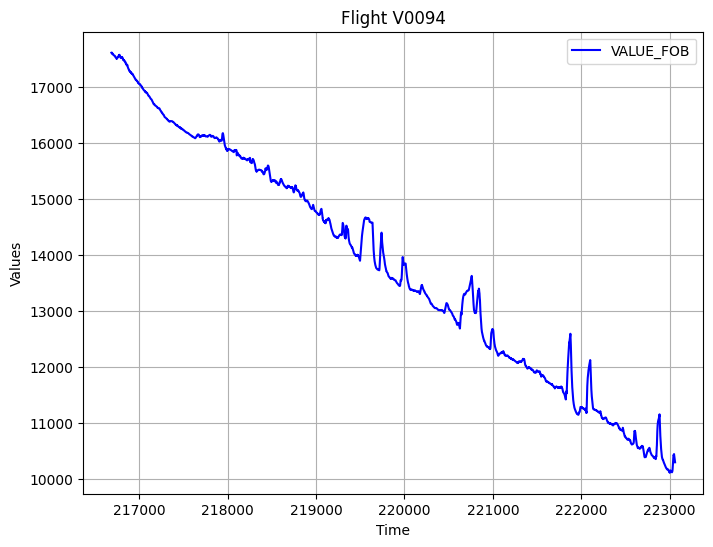

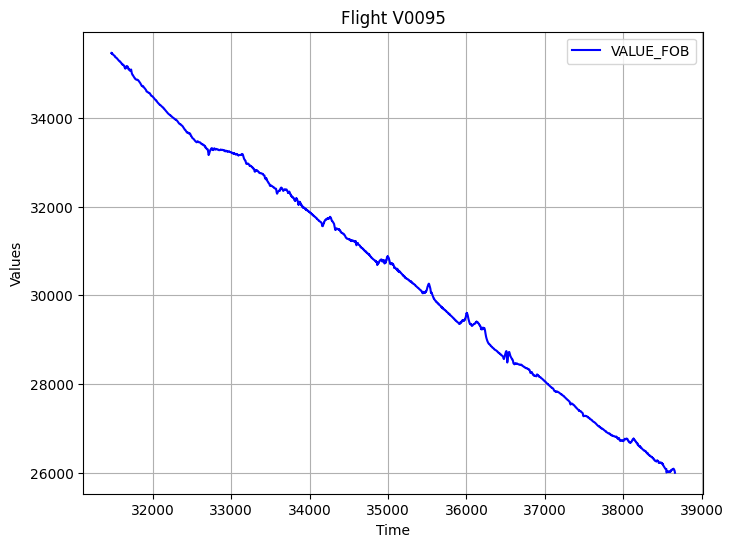

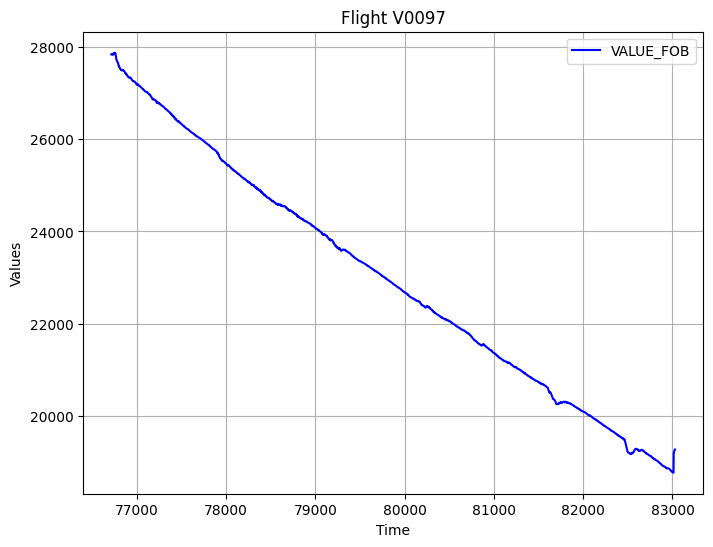

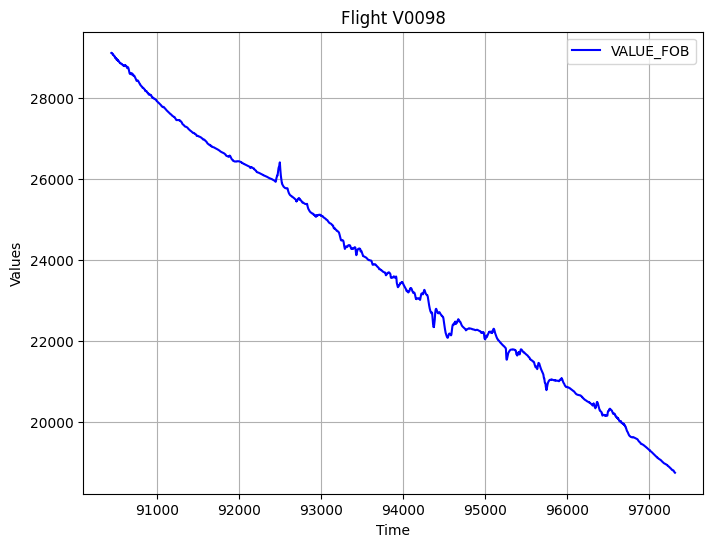

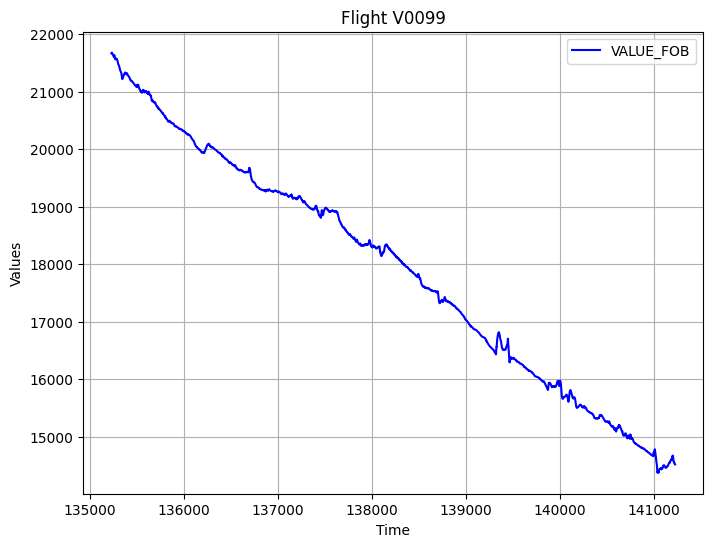

...

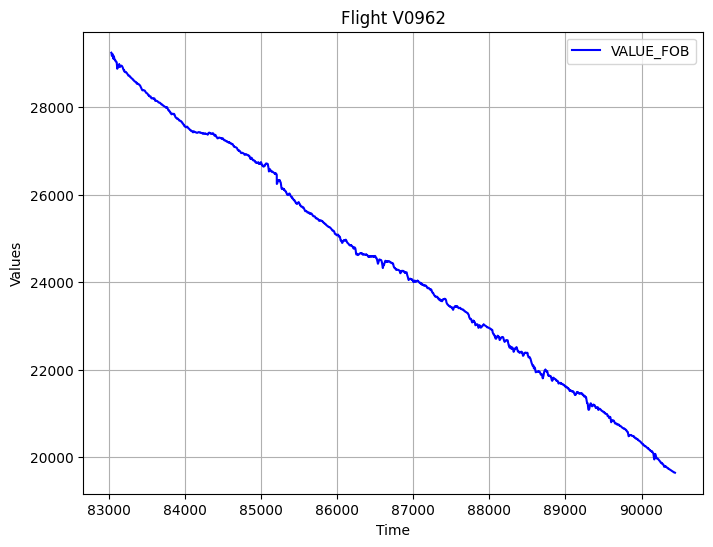

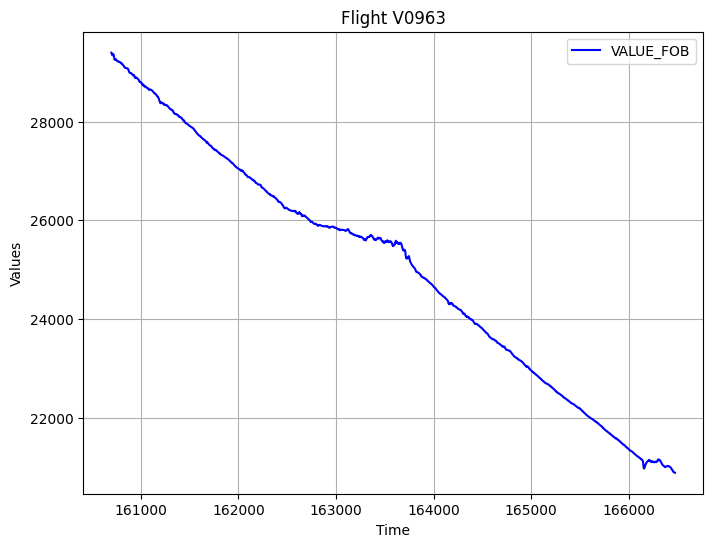

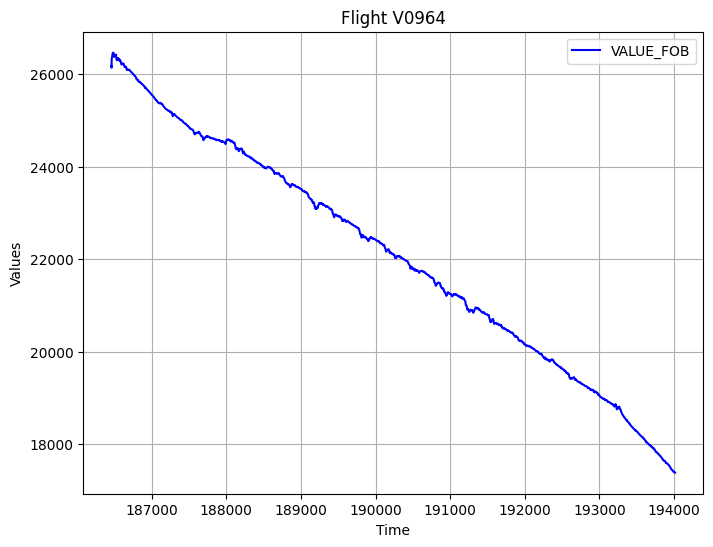

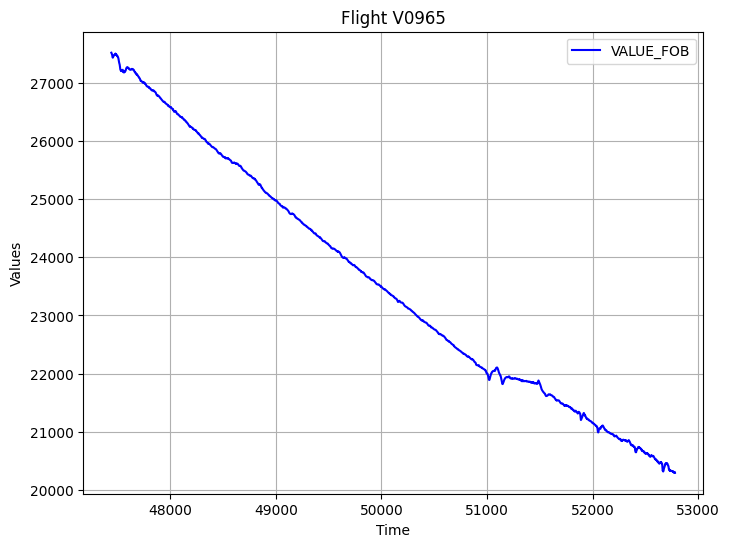

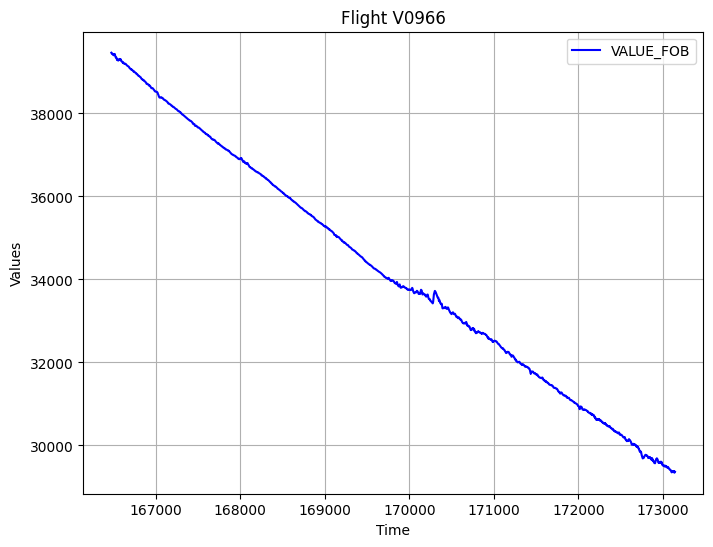

In [ ]:
import matplotlib.pyplot as plt

# Assuming df is your dataset DataFrame
# Assuming 'Flight' is the column indicating individual flights
# Assuming 'VALUE_FOB' is the column to be plotted against 'SMOOTHED_VALUE'

# Group the data by flight
flight_groups = msn02_cluster0.groupby('Flight')

# Create a plot for each flight
for flight, flight_data in flight_groups:
    plt.figure(figsize=(8, 6))
    plt.plot(flight_data.index, flight_data['VALUE_FOB'], label='VALUE_FOB', color='blue')
    #plt.plot(flight_data.index, flight_data['SMOOTHED_VALUE'], label='Smoothed_Value', color='red')
    plt.xlabel('Time')
    plt.ylabel('Values')
    plt.title(f'Flight {flight}')
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
# smoothing
import pandas as pd

# Group the data by flight
flight_groups = msn02_cluster0.groupby('Flight')

# Define smoothing parameter (alpha value)
alpha = 0.1  # You can adjust this value based on your requirements

# Apply exponential smoothing to each flight group
smoothed_data = []
for flight, flight_data in flight_groups:
    smoothed_flight_data = flight_data.copy()
    smoothed_flight_data['Smoothed_Value'] = flight_data['VALUE_FOB'].ewm(alpha=alpha, adjust=False).mean()
    smoothed_data.append(smoothed_flight_data)

# Combine smoothed data for all flights back into a single DataFrame
smoothed_df = pd.concat(smoothed_data)

# Sort the DataFrame by Flight and any other relevant columns
smoothed_df.sort_values(by=['Flight', 'UTC_TIME'], inplace=True)

# Display the smoothed DataFrame
print(smoothed_df)

                   UTC_TIME Flight  FLIGHT_PHASE_COUNT  VALUE_FOB  \
216687  2010-10-26 13:32:08  V0094                 8.0    17604.0   
216688  2010-10-26 13:32:09  V0094                 8.0    17595.0   
216689  2010-10-26 13:32:10  V0094                 8.0    17594.0   
216690  2010-10-26 13:32:11  V0094                 8.0    17599.0   
216691  2010-10-26 13:32:12  V0094                 8.0    17596.0   
...                     ...    ...                 ...        ...   
173139  2017-01-23 17:40:27  V0966                 8.0    29349.0   
173140  2017-01-23 17:40:28  V0966                 8.0    29353.0   
173141  2017-01-23 17:40:29  V0966                 8.0    29360.0   
173142  2017-01-23 17:40:30  V0966                 8.0    29365.0   
173143  2017-01-23 17:40:31  V0966                 8.0    29366.0   

        FW_GEO_ALTITUDE  TOTAL_FUEL_USED  FOB_dif  FUSED_dif  \
216687         1902.000         689.5716      1.0     2.0925   
216688         1942.750         691.6615   

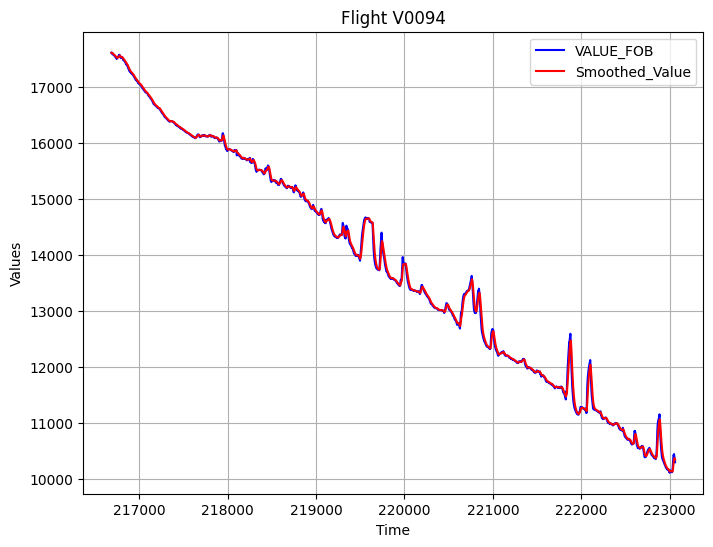

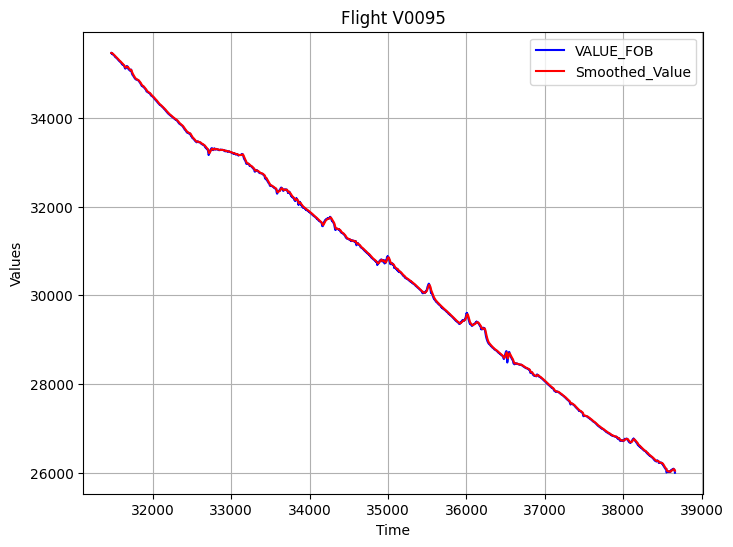

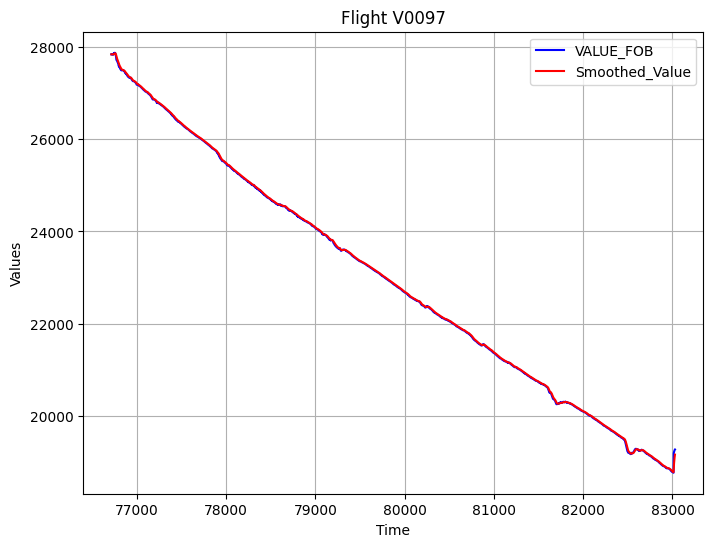

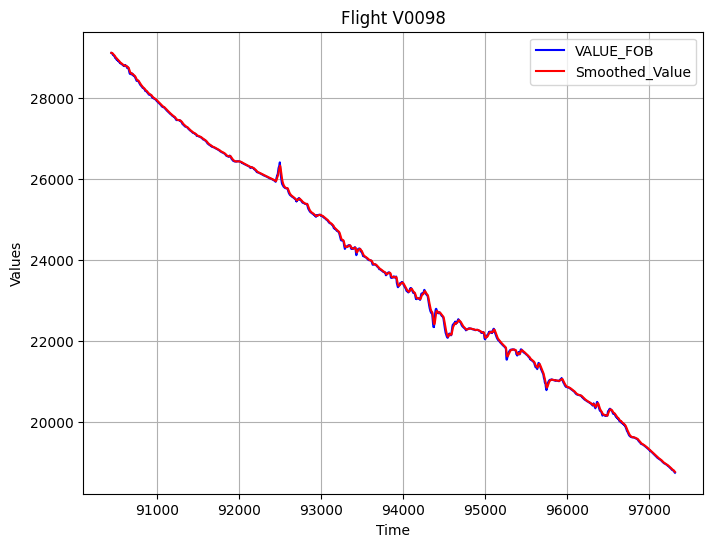

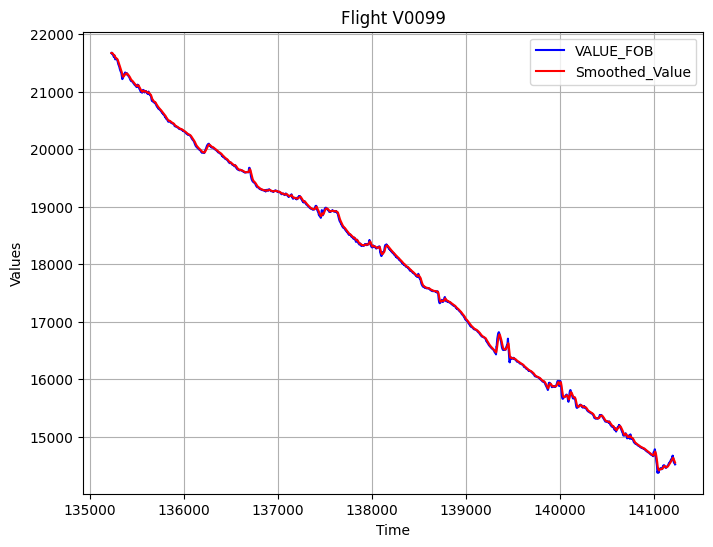

...

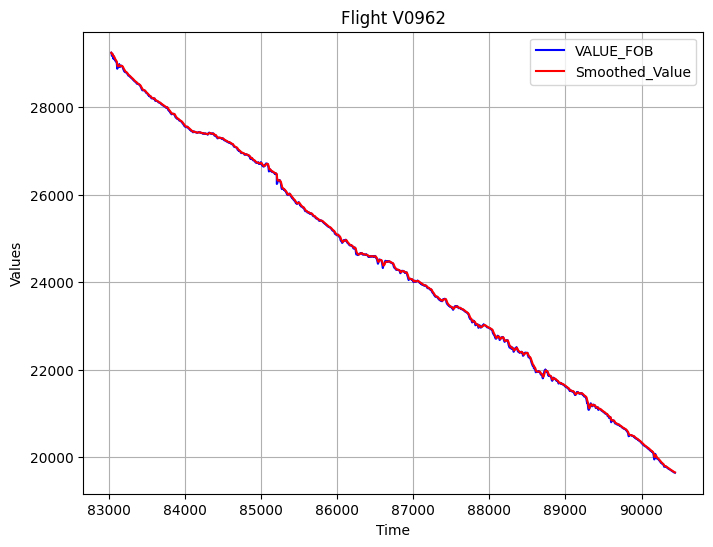

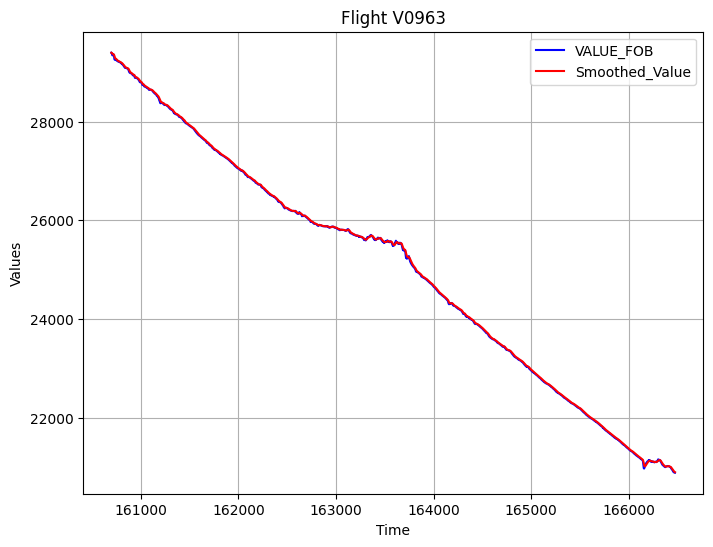

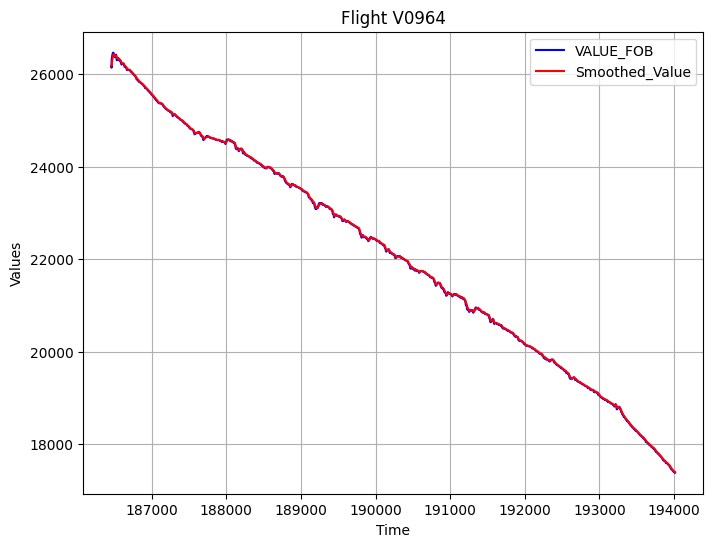

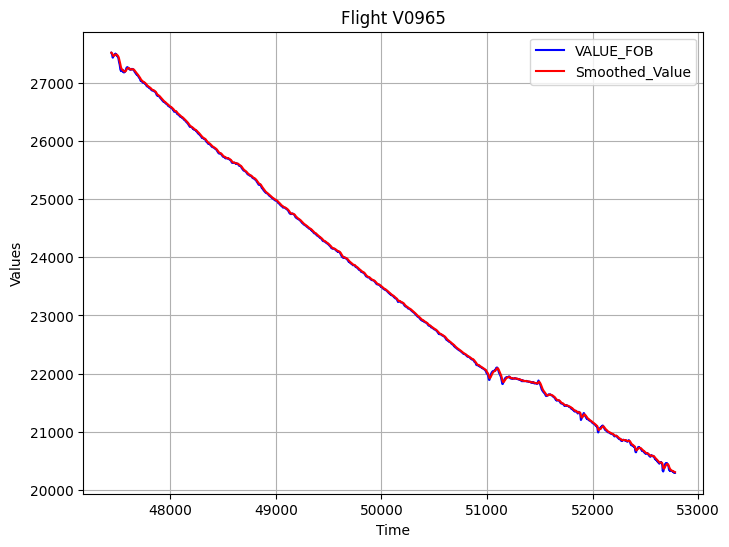

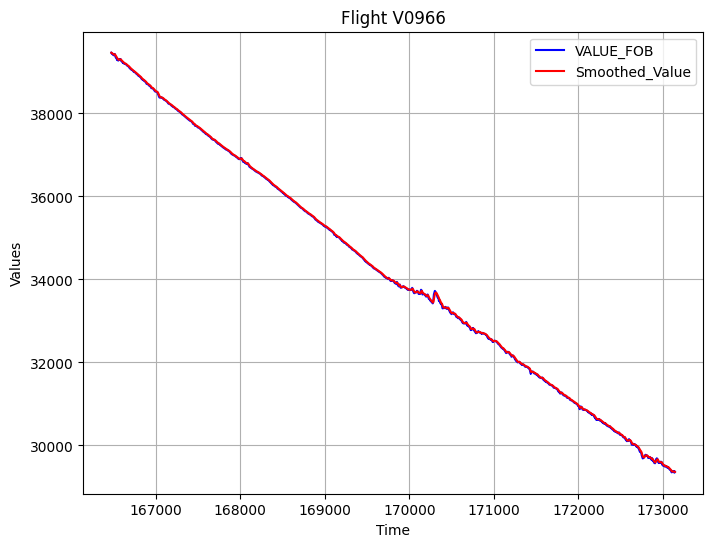

In [ ]:
# Group the data by flight
flight_groups = smoothed_df.groupby('Flight')

# Create a plot for each flight
for flight, flight_data in flight_groups:
    plt.figure(figsize=(8, 6))
    plt.plot(flight_data.index, flight_data['VALUE_FOB'], label='VALUE_FOB', color='blue')
    plt.plot(flight_data.index, flight_data['Smoothed_Value'], label='Smoothed_Value', color='red')
    plt.xlabel('Time')
    plt.ylabel('Values')
    plt.title(f'Flight {flight}')
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
# Calculate the moving average
window_size = 400
msn02_cluster0['Smoothed_Value'] = msn02_cluster0['VALUE_FOB'].rolling(window=window_size, min_periods=1).mean()

<ipython-input-36-320efcd22946>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  msn02_cluster0['Smoothed_Value'] = msn02_cluster0['VALUE_FOB'].rolling(window=window_size, min_periods=1).mean()


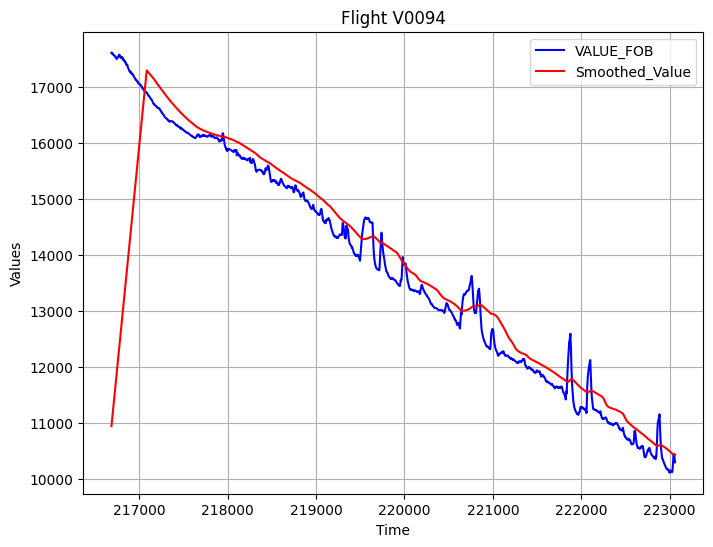

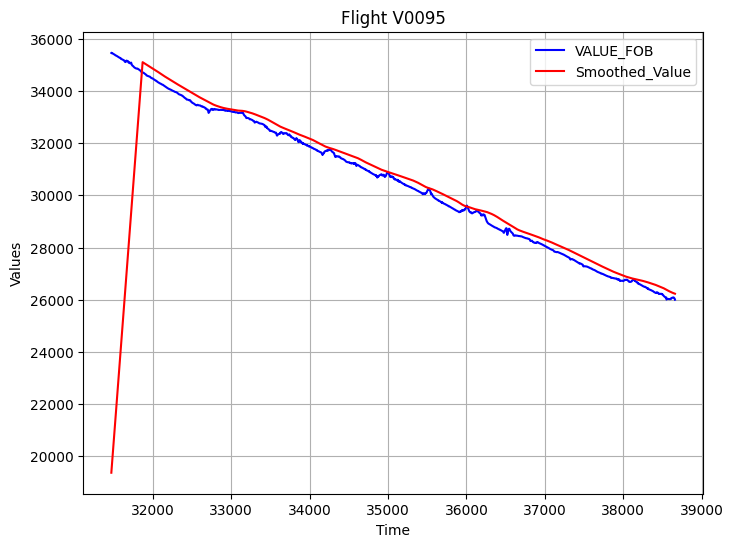

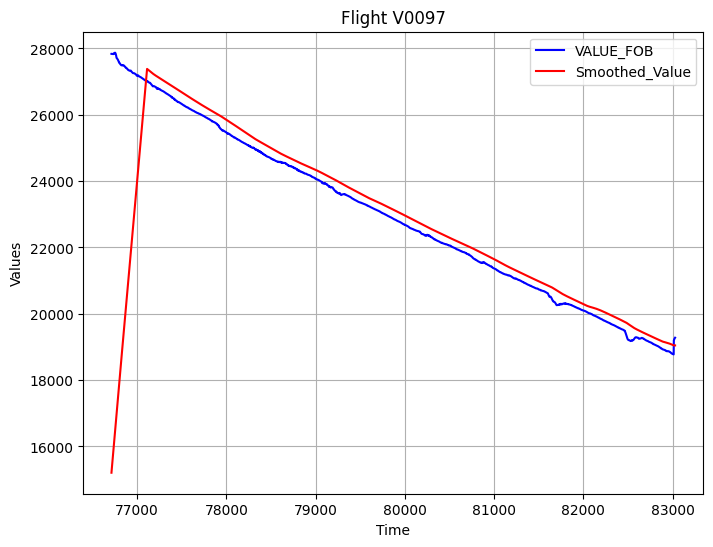

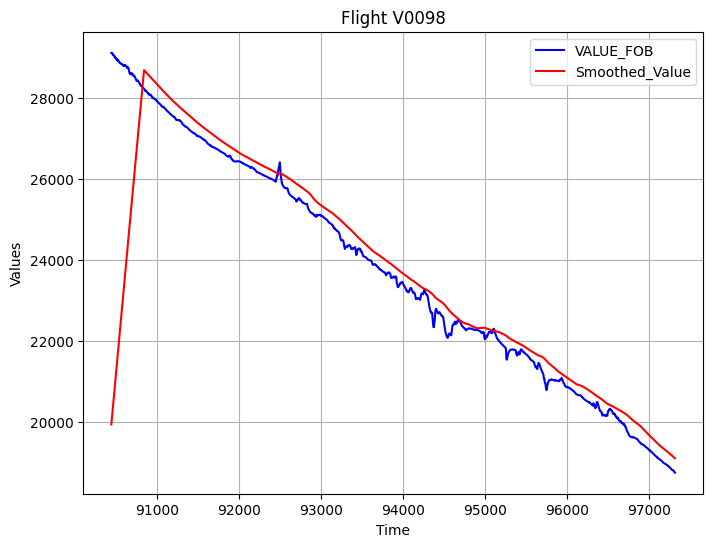

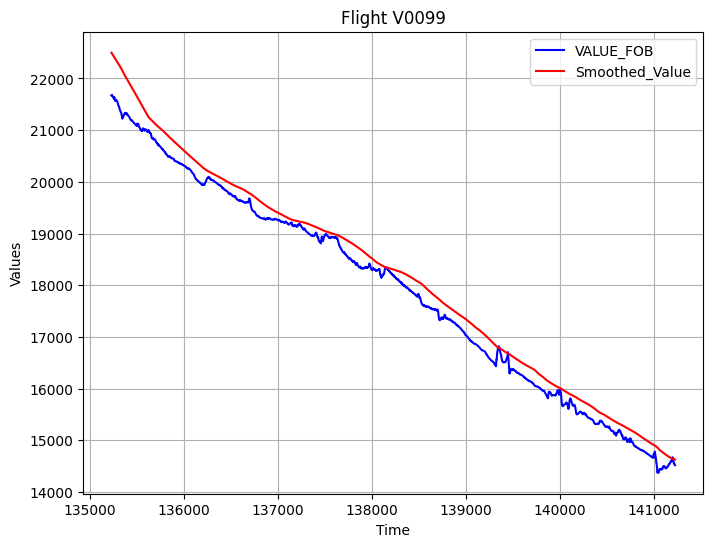

...

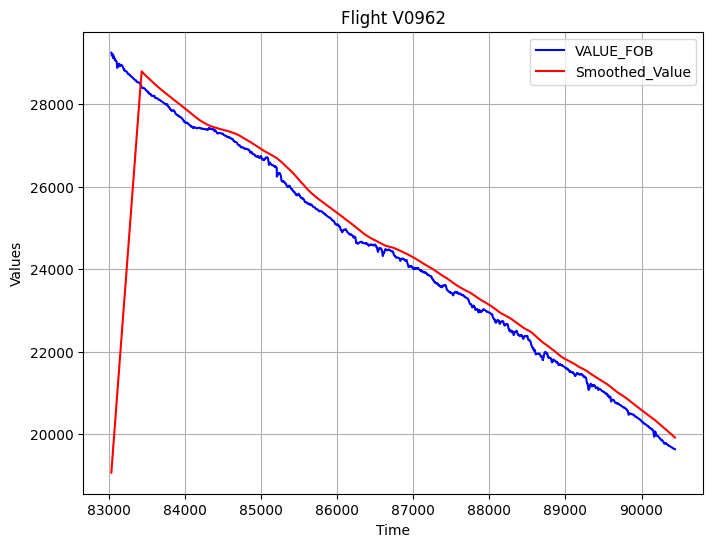

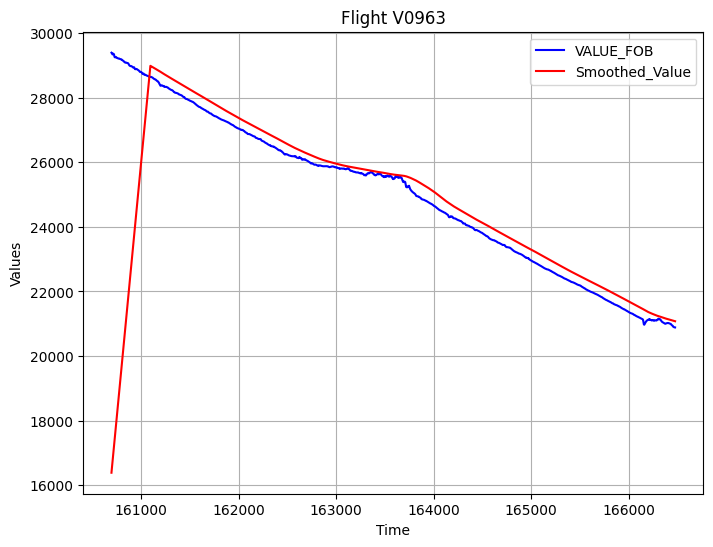

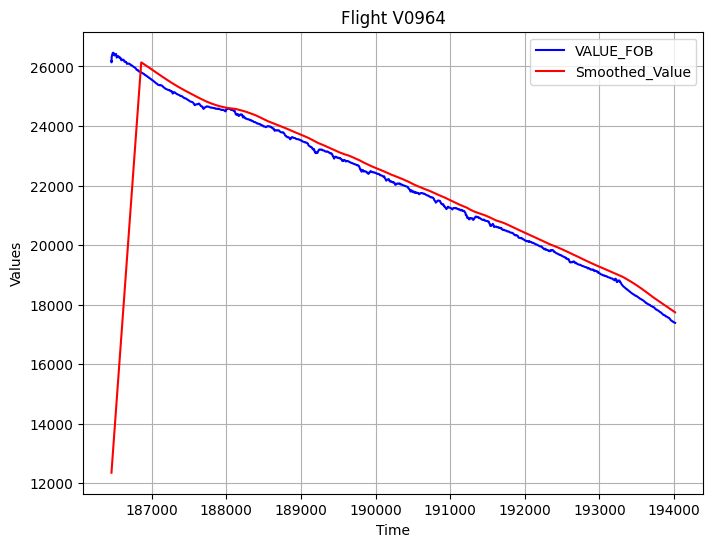

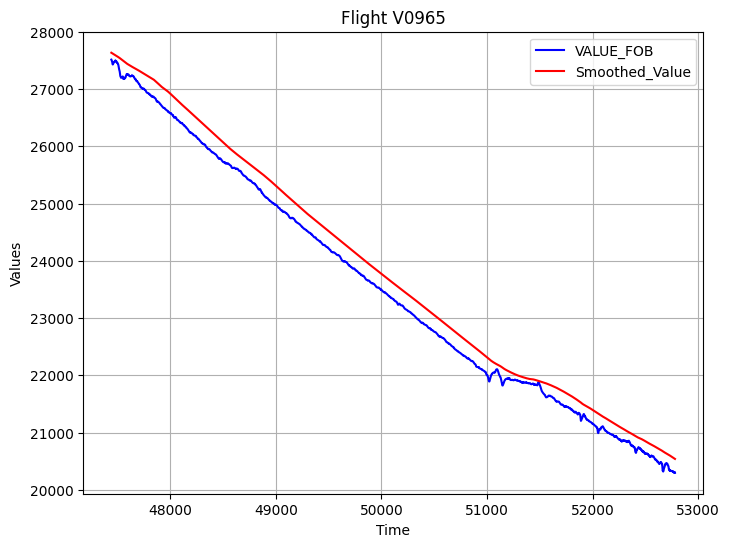

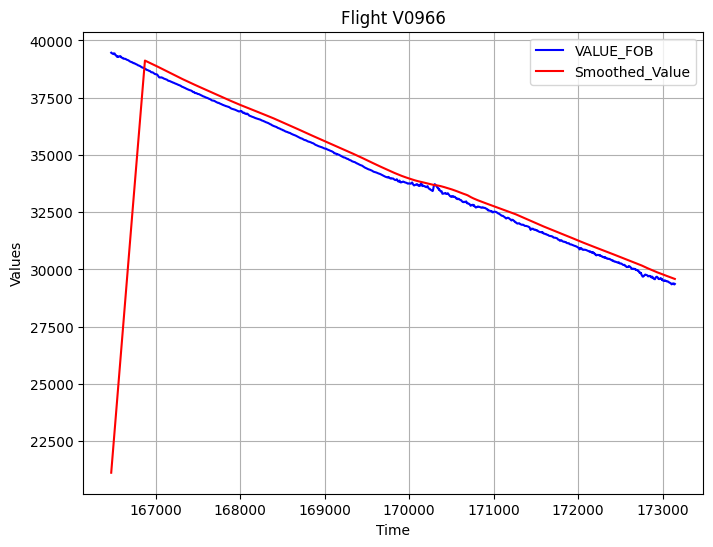

In [ ]:
#Group the data by flight
flight_groups = msn02_cluster0.groupby('Flight')

# Create a plot for each flight
for flight, flight_data in flight_groups:
    plt.figure(figsize=(8, 6))
    plt.plot(flight_data.index, flight_data['VALUE_FOB'], label='VALUE_FOB', color='blue')
    plt.plot(flight_data.index, flight_data['Smoothed_Value'], label='Smoothed_Value', color='red')
    plt.xlabel('Time')
    plt.ylabel('Values')
    plt.title(f'Flight {flight}')
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
msn02_cluster0['Smoothed_Value'] = msn02_cluster0['VALUE_FOB'].rolling(window=window_size, min_periods=1).mean()

# Append the first value of VALUE_FOB to the smoothed data
msn02_cluster0['Smoothed_Value'].iloc[0] = msn02_cluster0['VALUE_FOB'].iloc[0]

In [ ]:
msn02_cluster0 = msn02_cluster0[msn02_cluster0['Flight'] != 'V0138']

In [ ]:
import pandas as pd
import numpy as np

# Define the degree of the polynomial
degree = 5

# Function to apply polynomial smoothing within each flight group
def smooth_values(group):
    # Fit a polynomial curve to the data
    coeffs = np.polyfit(group.index, group['VALUE_FOB'], degree)
    poly = np.poly1d(coeffs)

    # Predict smoothed values using the polynomial curve
    group['Smoothed_Value'] = poly(group.index)
    return group

# Apply polynomial smoothing within each flight group and concatenate the results
smoothed_data = msn02_cluster0.groupby('Flight').apply(smooth_values)

# Sort the DataFrame by 'UTC_TIME' to restore the original order if needed
smoothed_data.sort_index(inplace=True)

# Save the smoothed values as a new column in the original DataFrame
msn02_cluster0['Smoothed_Value'] = smoothed_data['Smoothed_Value']

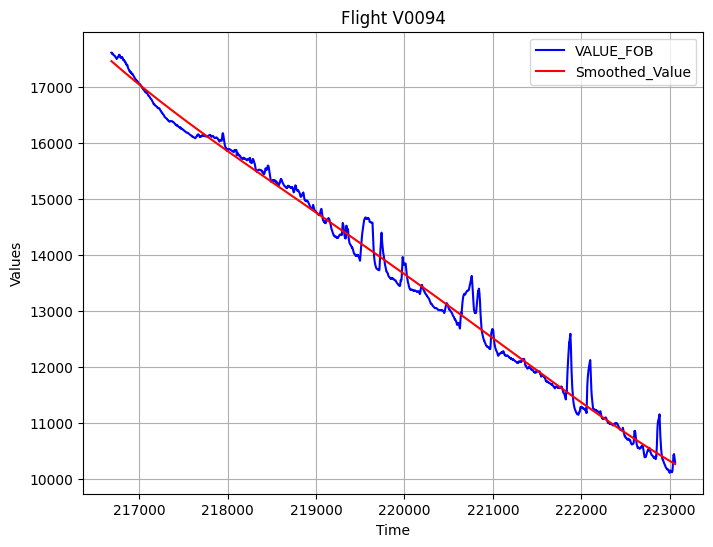

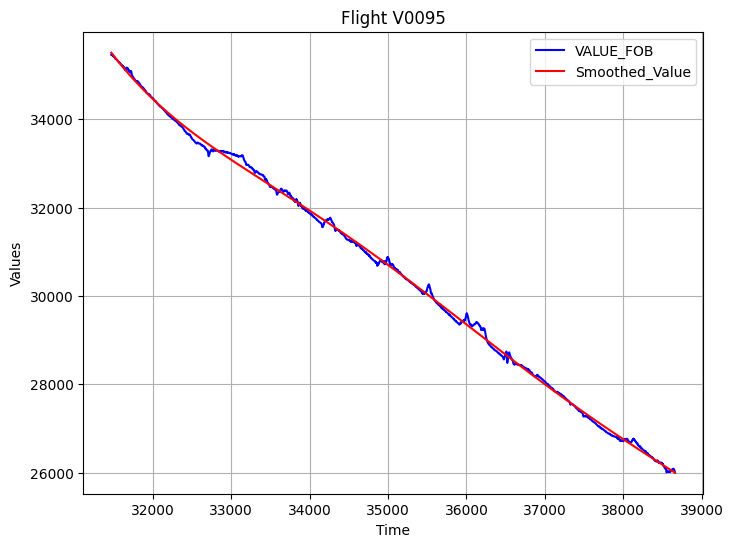

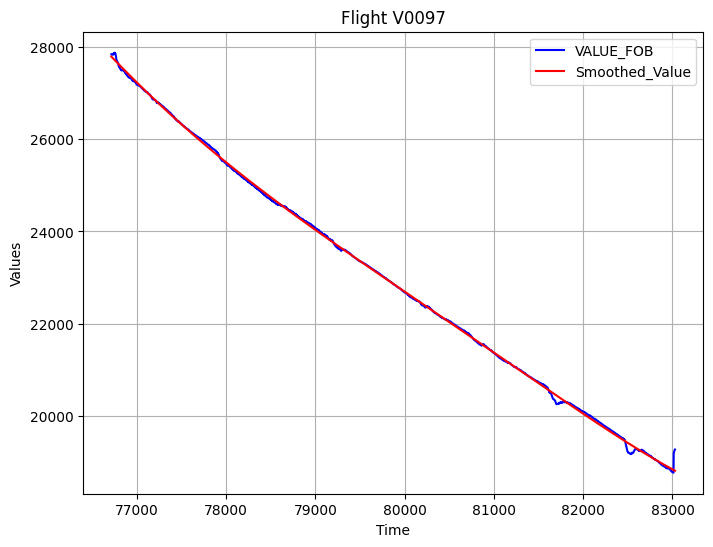

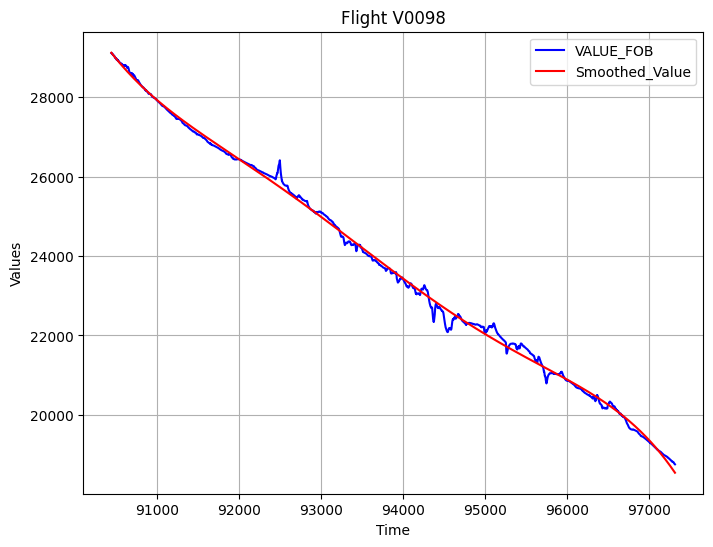

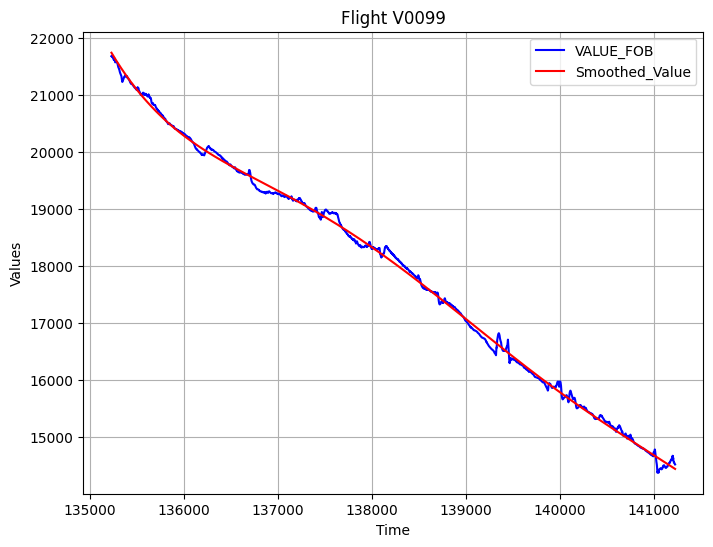

...

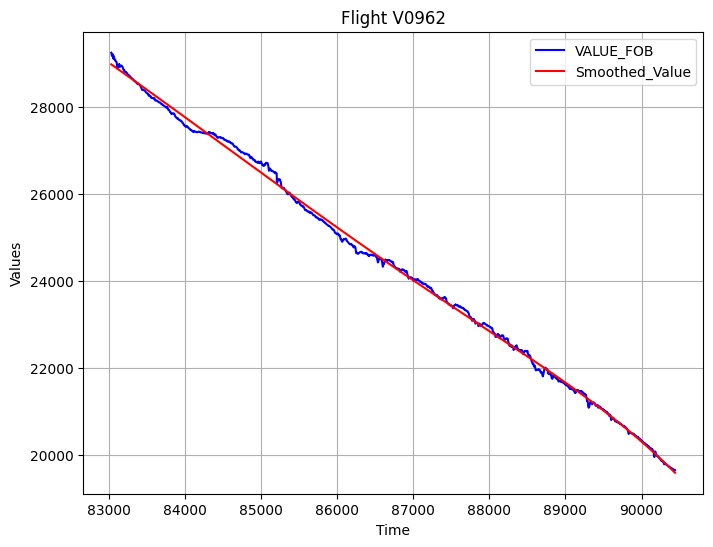

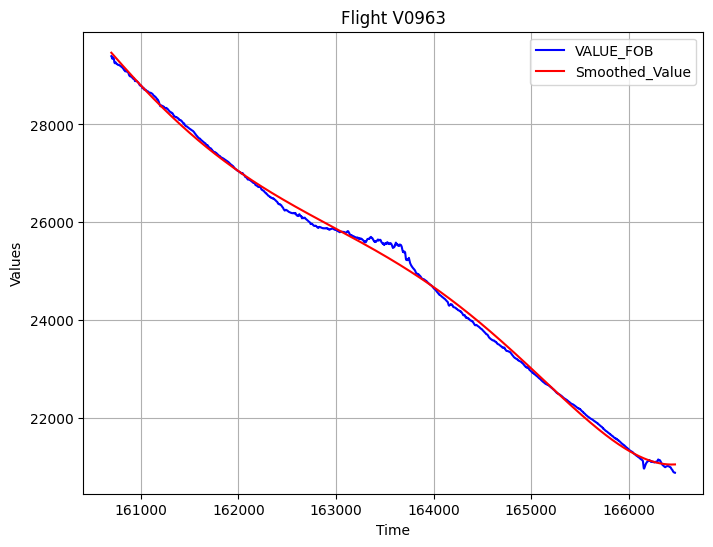

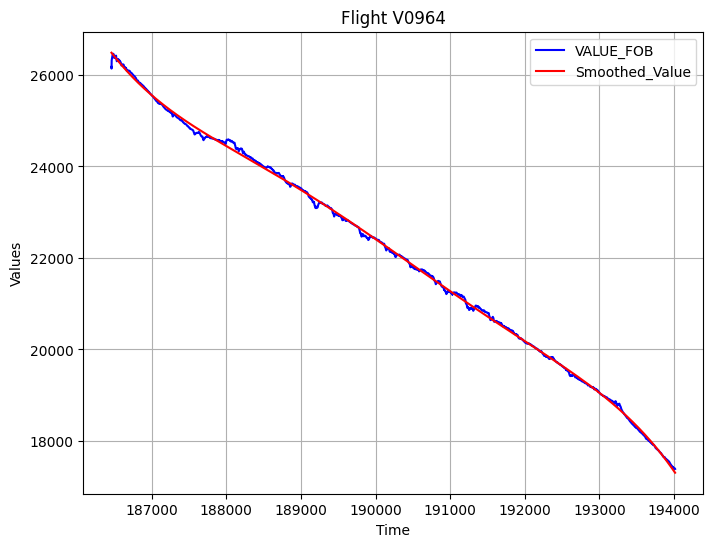

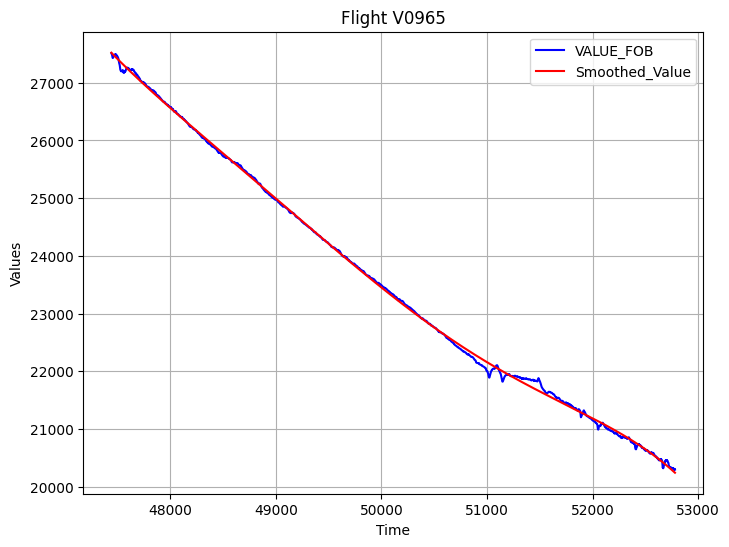

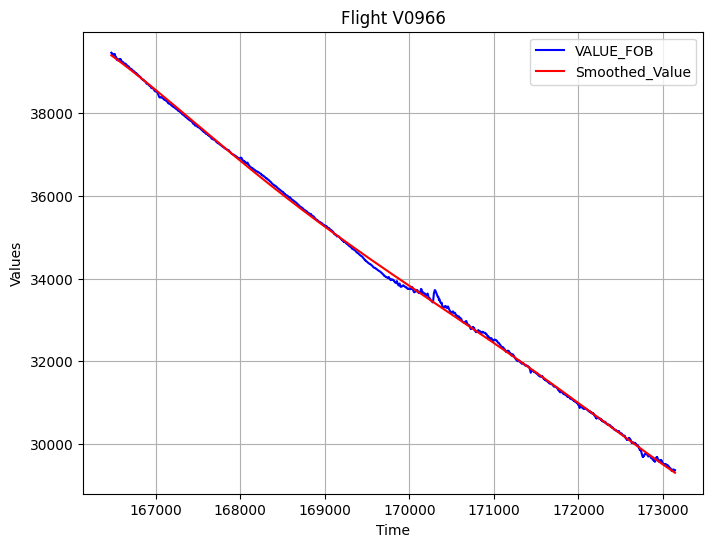

In [ ]:
#Group the data by flight
flight_groups = msn02_cluster0.groupby('Flight')

# Create a plot for each flight
for flight, flight_data in flight_groups:
    plt.figure(figsize=(8, 6))
    plt.plot(flight_data.index, flight_data['VALUE_FOB'], label='VALUE_FOB', color='blue')
    plt.plot(flight_data.index, flight_data['Smoothed_Value'], label='Smoothed_Value', color='red')
    plt.xlabel('Time')
    plt.ylabel('Values')
    plt.title(f'Flight {flight}')
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
msn02_cluster0.to_csv('msn02_cluster0_smoothed_features.csv')

In [ ]:
msn02_cluster0

,UTC_TIME,Flight,FLIGHT_PHASE_COUNT,VALUE_FOB,FW_GEO_ALTITUDE,TOTAL_FUEL_USED,FOB_dif,FUSED_dif,SECONDS_PER_FLIGHT,TOTAL_SECONDS_PER_FLIGHT,Cluster,FOB_CONSUMPTION,VALUE_FOB_vs_CONSUMPTION,DIFF_VALUE_FOB_vs_FROM_CONSUMPTION,Smoothed_Value
0,2011-03-09 12:44:19,V0136,8.0,26046.0,1847.500,908.3574,0.0,0.3590,0.0,14048.0,2.0,26046.0000,0.0000,NaN,26045.599788
1,2011-03-09 12:44:20,V0136,8.0,26042.0,1866.875,910.3853,-4.0,2.0279,1.0,14048.0,2.0,26043.9721,-1.9721,-1.9721,26044.286253
2,2011-03-09 12:44:21,V0136,8.0,26038.0,1886.375,912.5397,-4.0,2.1544,2.0,14048.0,2.0,26041.8177,-3.8177,-1.8456,26042.971806
3,2011-03-09 12:44:22,V0136,8.0,26032.0,1906.000,914.5687,-6.0,2.0290,3.0,14048.0,2.0,26039.7887,-7.7887,-3.9710,26041.656449
4,2011-03-09 12:44:23,V0136,8.0,26029.0,1925.750,916.7865,-3.0,2.2178,4.0,14048.0,2.0,26037.5709,-8.5709,-0.7822,26040.340183
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
234449,2011-03-10 14:28:05,V0137,8.0,19632.0,15310.000,8374.1960,2.0,1.8350,5866.0,16002.0,2.0,19560.2601,71.7399,3.8350,19556.844646
234450,2011-03-10 14:28:06,V0137,8.0,19634.0,15319.130,8376.0330,2.0,1.8370,5867.0,16002.0,2.0,19558.4231,75.5769,3.8370,19554.846214
234451,2011-03-10 14:28:07,V0137,8.0,19638.0,15327.000,8377.8700,4.0,1.8370,5868.0,16002.0,2.0,19556.5861,81.4139,5.7840,19552.846632
234452,2011-03-10 14:28:08,V0137,8.0,19642.0,15334.380,8379.6530,4.0,1.7830,5869.0,16002.0,2.0,19554.8031,87.1969,5.7830,19550.845900


In [ ]:
msn02_cluster0.groupby('Flight').size().mean()

5977.486486486487

In [ ]:
msn02_cluster0_leakage1kgs = msn02_cluster0.copy()
msn02_cluster0_leakage5kgs = msn02_cluster0.copy()
msn02_cluster0_leakage500g = msn02_cluster0.copy()

In [ ]:
#Introducing Leakages for msn02_cluster0_leakage500g
leak_constant = 0.5

# Initialize the 'LEAKAGE' column with 0
msn02_cluster0_leakage500g['LEAKAGE'] = msn02_cluster0_leakage500g['SECONDS_PER_FLIGHT'] * leak_constant

In [ ]:
msn02_cluster0_leakage500g['Simulated_FOB'] = msn02_cluster0_leakage500g['Smoothed_Value'] - msn02_cluster0_leakage500g['LEAKAGE']

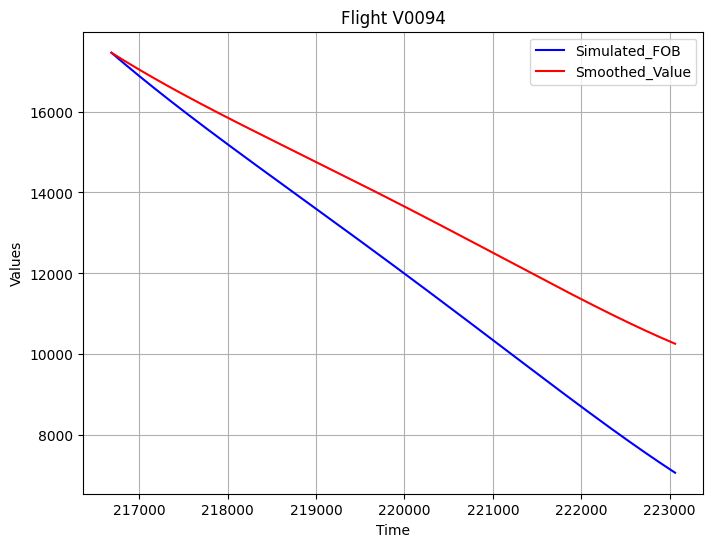

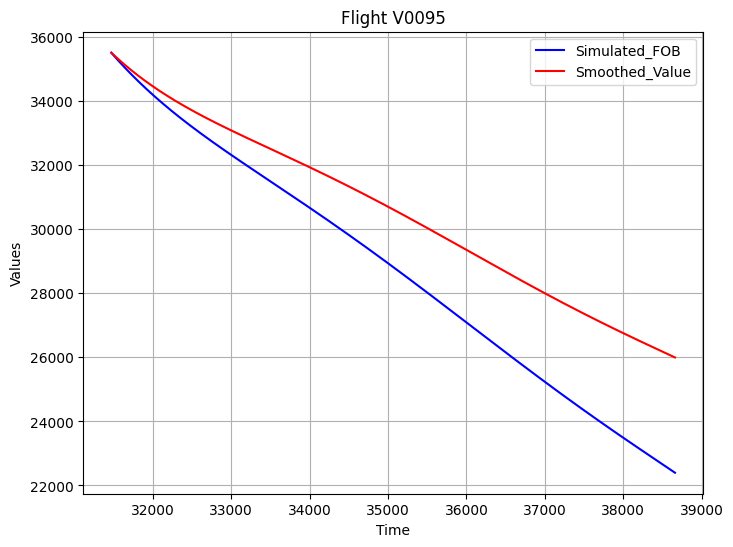

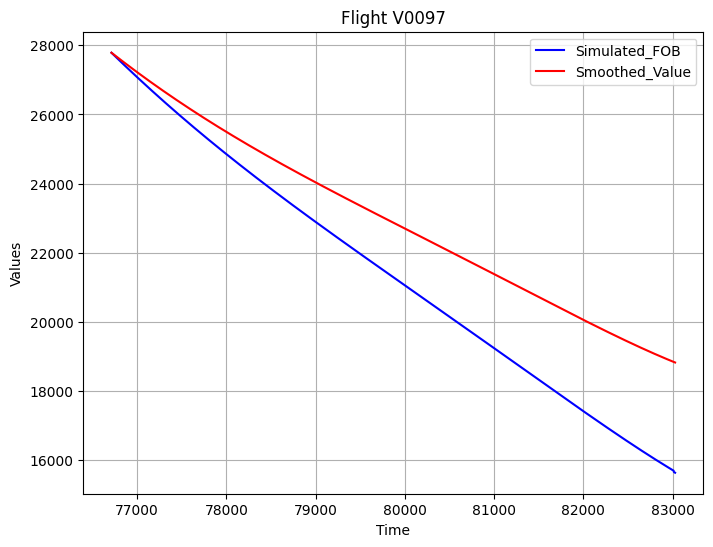

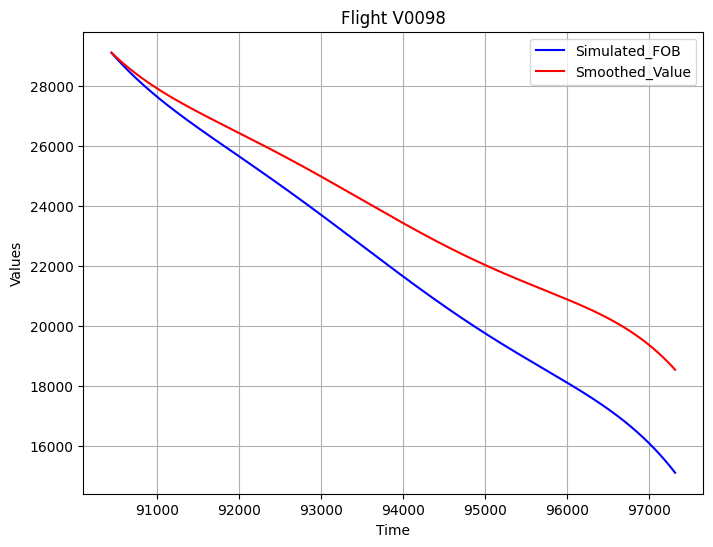

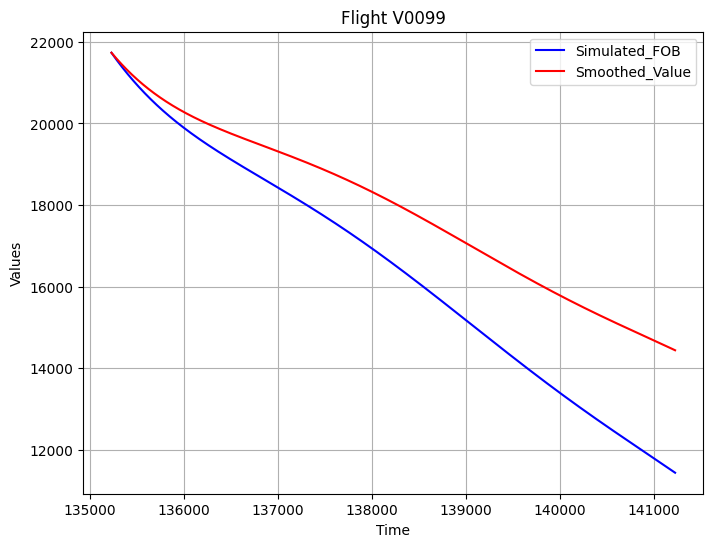

...

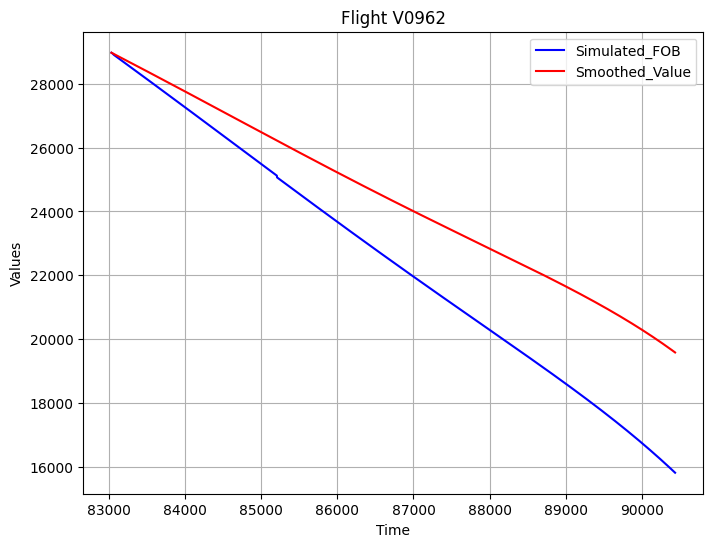

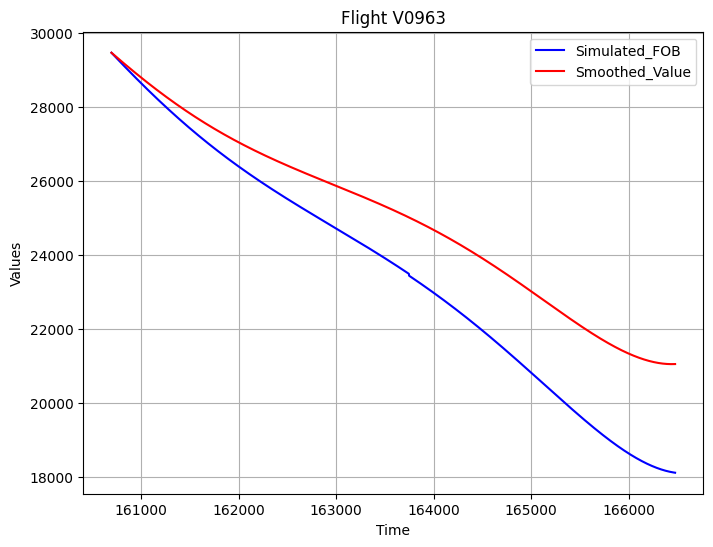

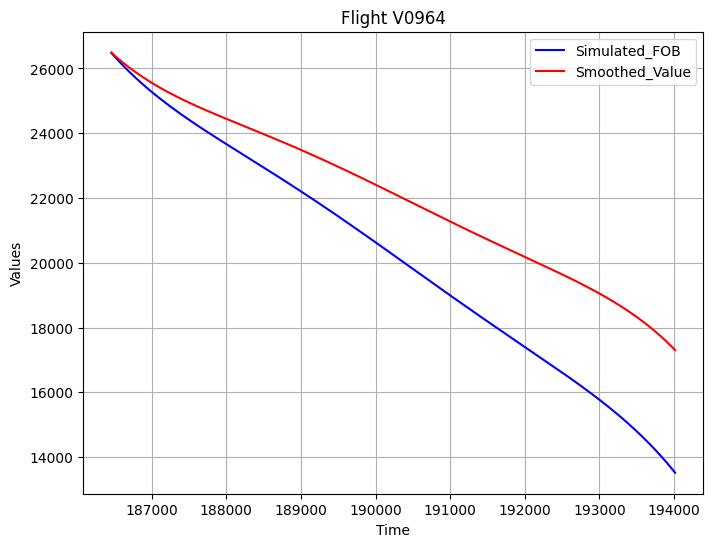

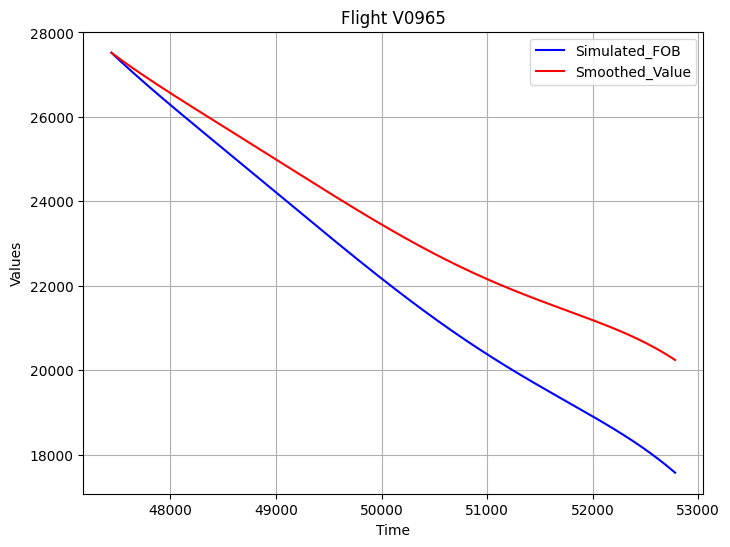

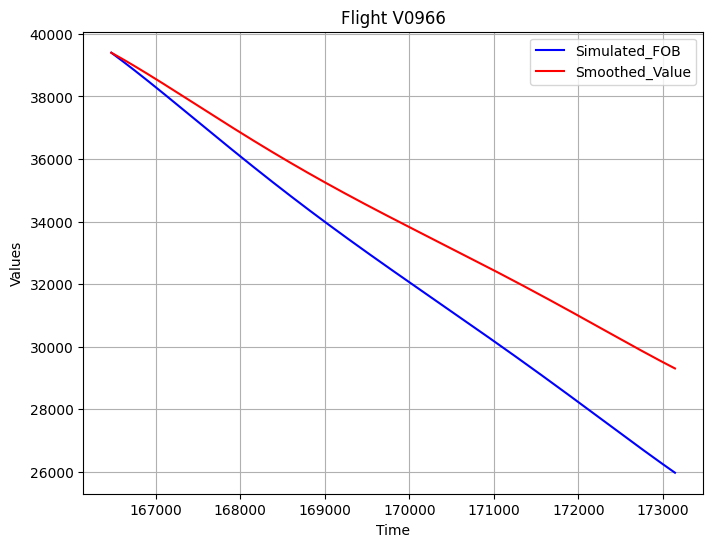

In [ ]:
#Group the data by flight
flight_groups = msn02_cluster0_leakage500g.groupby('Flight')

# Create a plot for each flight
for flight, flight_data in flight_groups:
    plt.figure(figsize=(8, 6))
    plt.plot(flight_data.index, flight_data['Simulated_FOB'], label='Simulated_FOB', color='blue')
    plt.plot(flight_data.index, flight_data['Smoothed_Value'], label='Smoothed_Value', color='red')
    plt.xlabel('Time')
    plt.ylabel('Values')
    plt.title(f'Flight {flight}')
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
msn02_cluster0_leakage500g.to_csv('msn02_cluster0_simulated500g.csv')

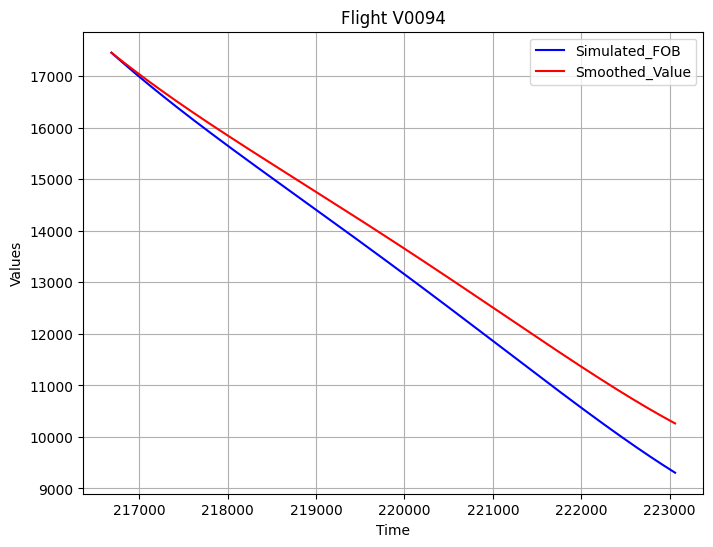

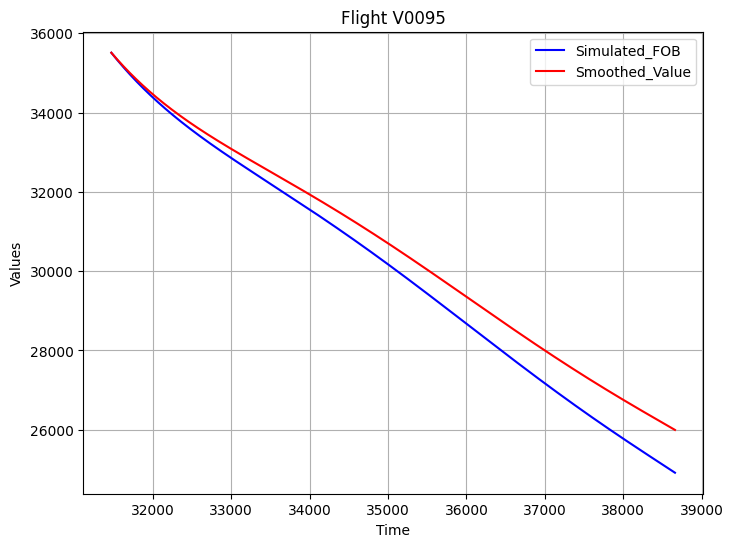

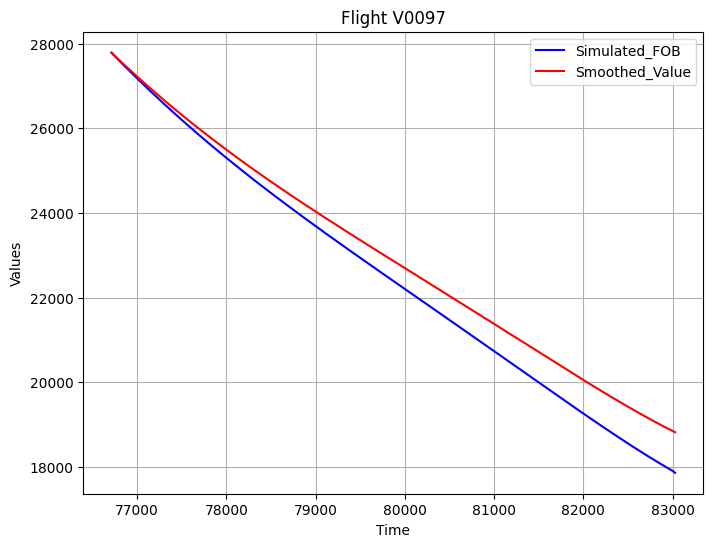

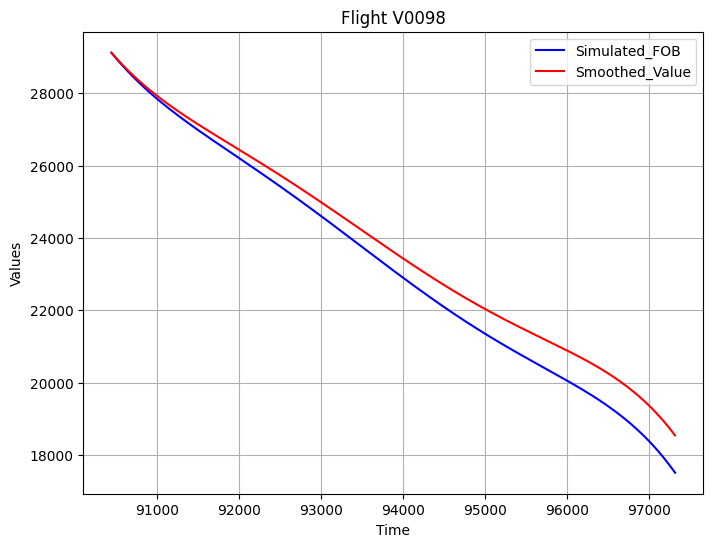

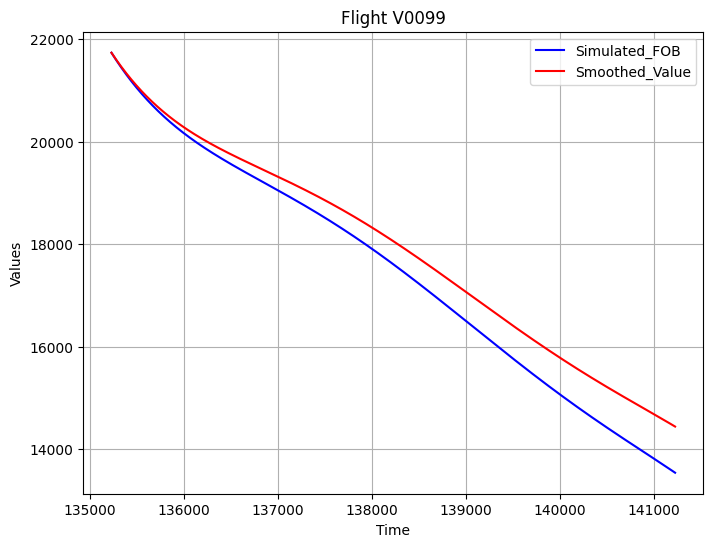

...

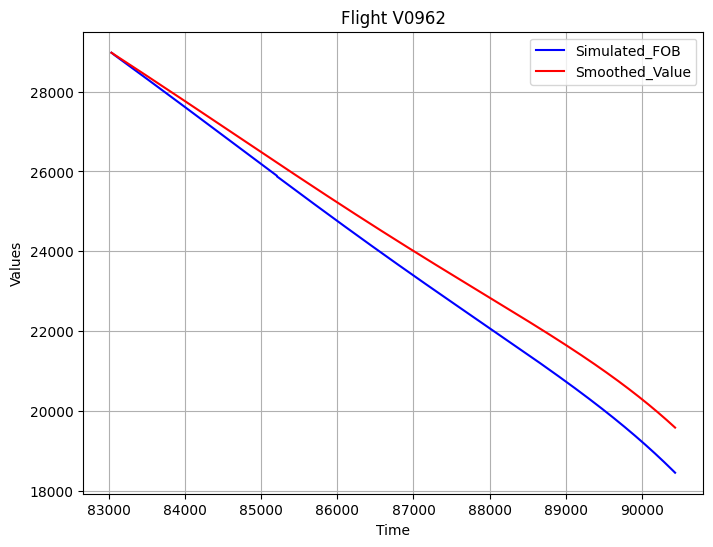

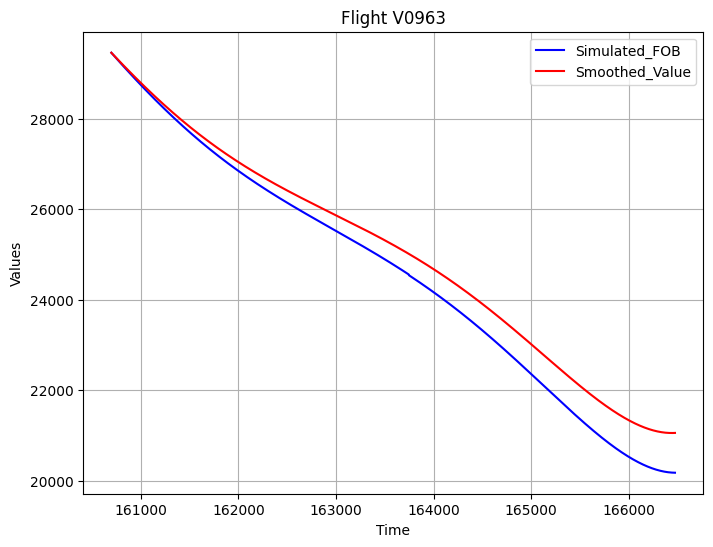

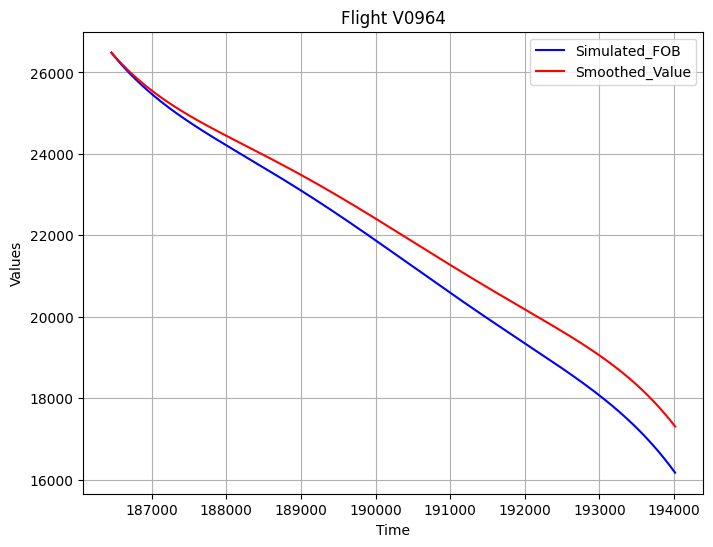

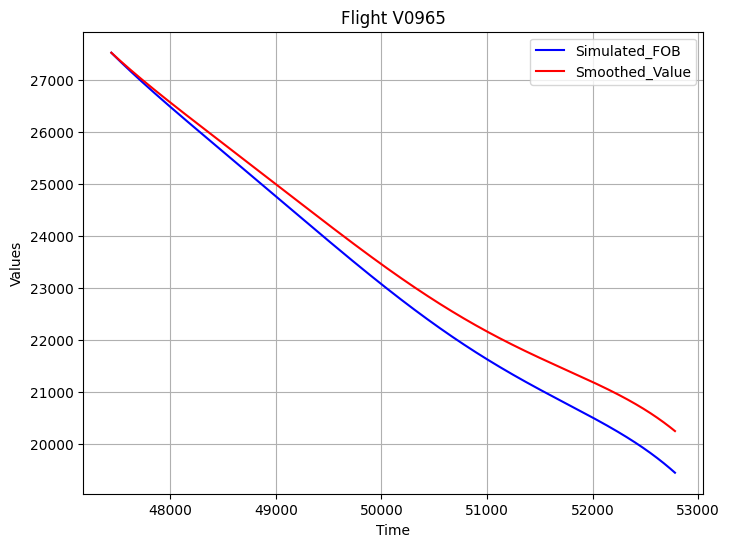

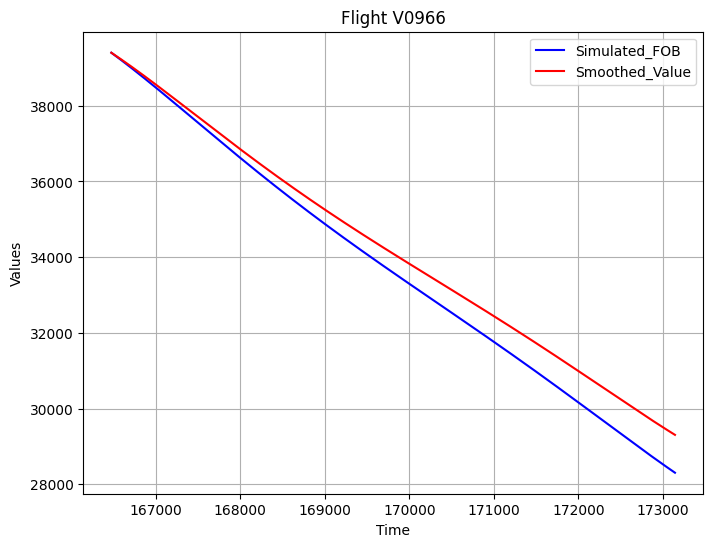

In [ ]:
#Introducing Leakages for msn02_cluster0_leakage500g
leak_constant = 0.15

# Initialize the 'LEAKAGE' column with 0
msn02_cluster0_leakage1kgs['LEAKAGE'] = msn02_cluster0_leakage1kgs['SECONDS_PER_FLIGHT'] * leak_constant

msn02_cluster0_leakage1kgs['Simulated_FOB'] = msn02_cluster0_leakage1kgs['Smoothed_Value'] - msn02_cluster0_leakage1kgs['LEAKAGE']

#Group the data by flight
flight_groups = msn02_cluster0_leakage1kgs.groupby('Flight')

# Create a plot for each flight
for flight, flight_data in flight_groups:
    plt.figure(figsize=(8, 6))
    plt.plot(flight_data.index, flight_data['Simulated_FOB'], label='Simulated_FOB', color='blue')
    plt.plot(flight_data.index, flight_data['Smoothed_Value'], label='Smoothed_Value', color='red')
    plt.xlabel('Time')
    plt.ylabel('Values')
    plt.title(f'Flight {flight}')
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
msn02_cluster0_leakage1kgs.to_csv('msn02_cluster0_simulated150g.csv')

In [ ]:
grouped_by_flight = msn02_cluster0_leakage1kgs.groupby('Flight')

# Iterate over the groups
for flight, group_data in grouped_by_flight:
    # Get the last value of 'LEAKAGE' for the flight
    last_leakage_value = group_data['LEAKAGE'].iloc[-1]
    # Print the flight and its last 'LEAKAGE' value
    print(f"Flight {flight}: Last LEAKAGE value = {last_leakage_value}")

Flight V0094: Last LEAKAGE value = 956.25
Flight V0095: Last LEAKAGE value = 1079.55
Flight V0097: Last LEAKAGE value = 957.3
Flight V0098: Last LEAKAGE value = 1031.7
Flight V0099: Last LEAKAGE value = 900.4499999999999
Flight V0133: Last LEAKAGE value = 1120.05
Flight V0134: Last LEAKAGE value = 1048.6499999999999
Flight V0135: Last LEAKAGE value = 900.6
Flight V0136: Last LEAKAGE value = 950.8499999999999
Flight V0137: Last LEAKAGE value = 880.5
Flight V0138: Last LEAKAGE value = 957.5999999999999
Flight V0140: Last LEAKAGE value = 922.8
Flight V0344: Last LEAKAGE value = 1075.2
Flight V0345: Last LEAKAGE value = 967.65
Flight V0346: Last LEAKAGE value = 1066.05
Flight V0348: Last LEAKAGE value = 821.25
Flight V0622: Last LEAKAGE value = 1056.0
Flight V0623: Last LEAKAGE value = 1317.3
Flight V0624: Last LEAKAGE value = 887.4
Flight V0625: Last LEAKAGE value = 882.0
Flight V0626: Last LEAKAGE value = 1066.05
Flight V0833: Last LEAKAGE value = 966.0
Flight V0834: Last LEAKAGE value =

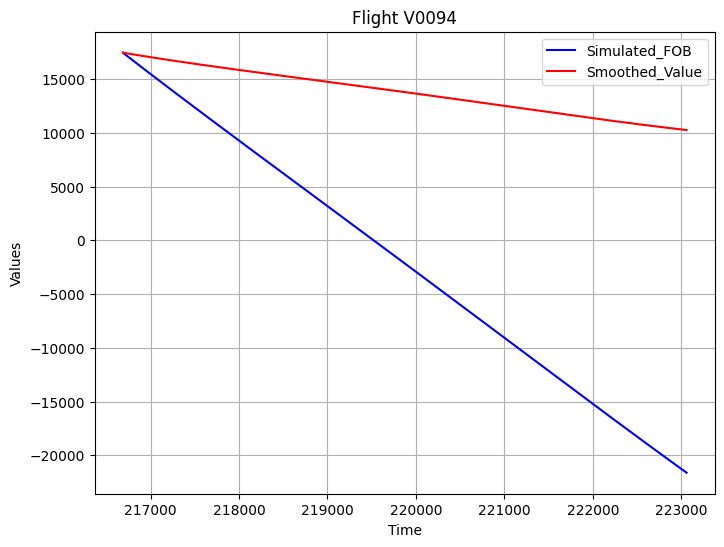

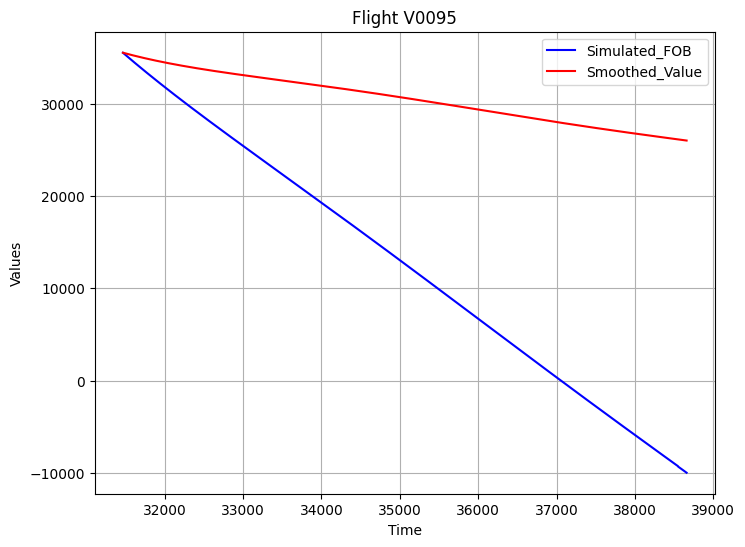

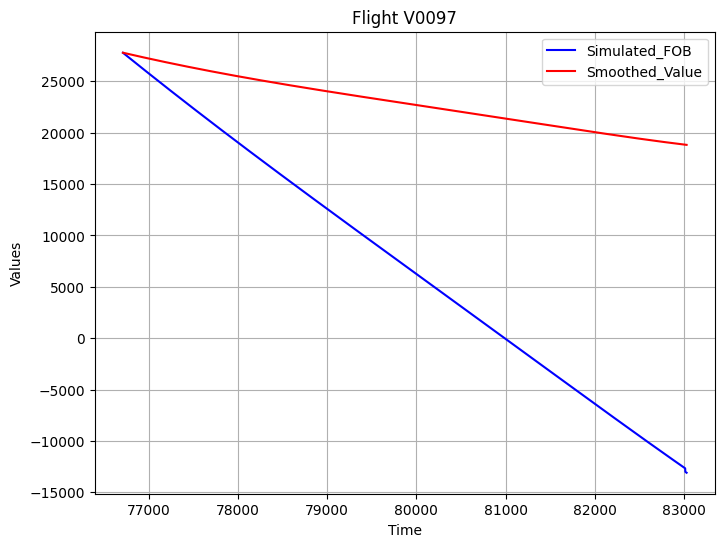

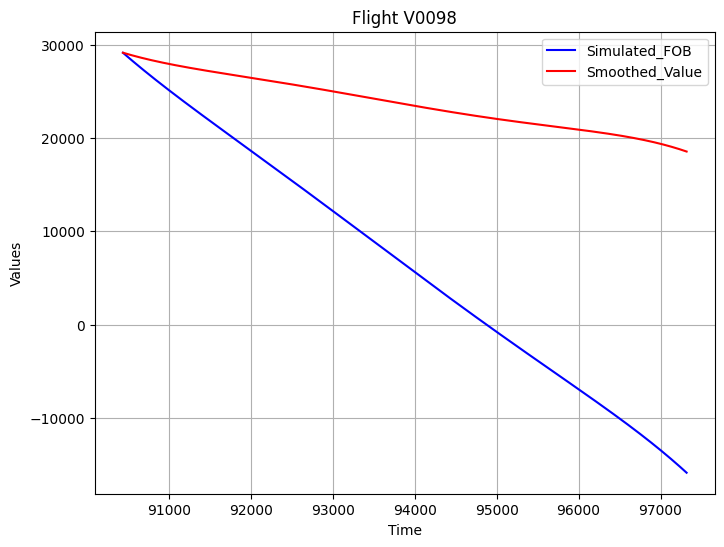

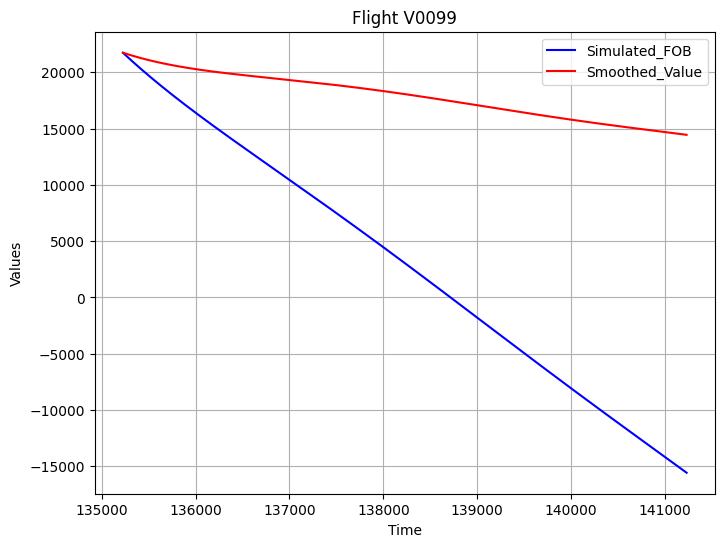

...

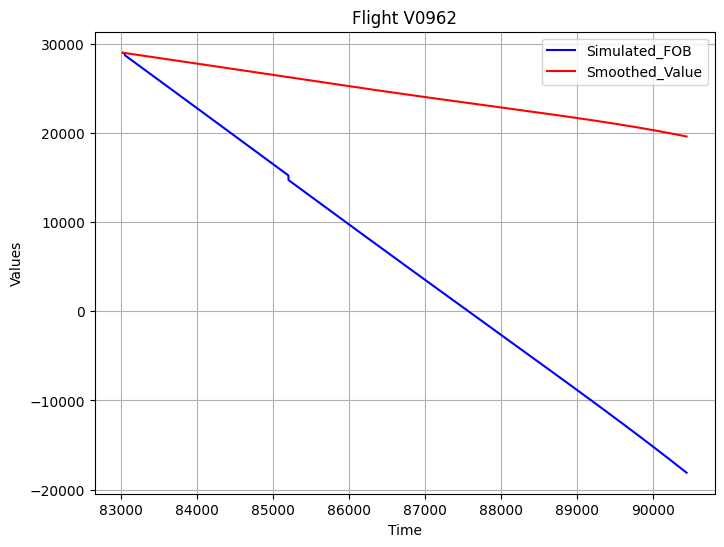

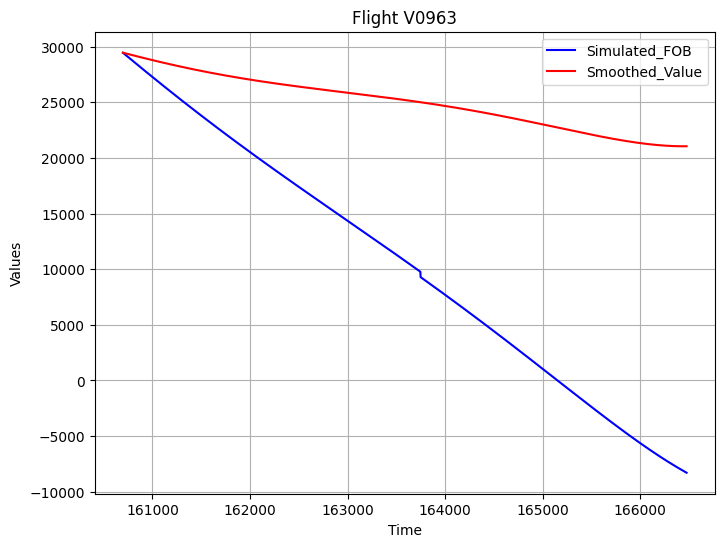

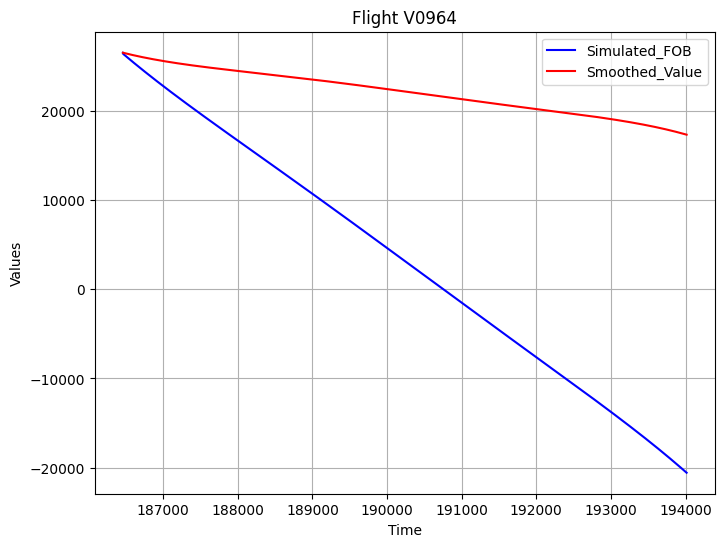

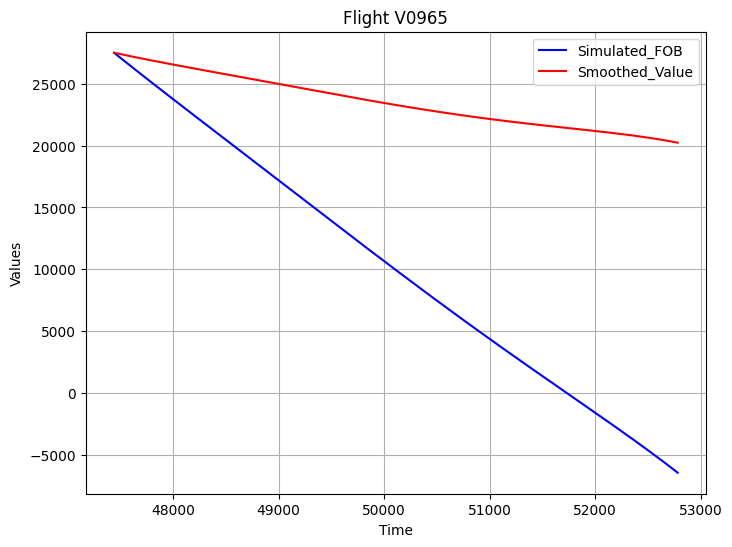

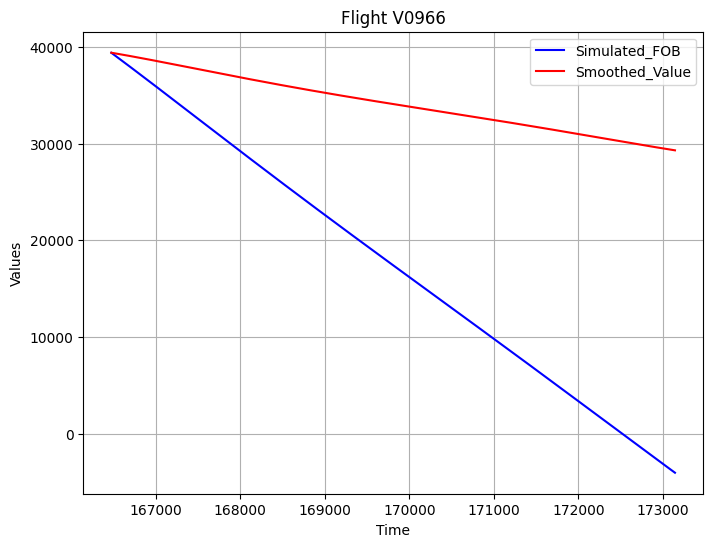

In [ ]:
#Introducing Leakages for msn02_cluster0_leakage500g
leak_constant = 5

# Initialize the 'LEAKAGE' column with 0
msn02_cluster0_leakage5kgs['LEAKAGE'] = msn02_cluster0_leakage5kgs['SECONDS_PER_FLIGHT'] * leak_constant

msn02_cluster0_leakage5kgs['Simulated_FOB'] = msn02_cluster0_leakage5kgs['Smoothed_Value'] - msn02_cluster0_leakage5kgs['LEAKAGE']

#Group the data by flight
flight_groups = msn02_cluster0_leakage5kgs.groupby('Flight')

# Create a plot for each flight
for flight, flight_data in flight_groups:
    plt.figure(figsize=(8, 6))
    plt.plot(flight_data.index, flight_data['Simulated_FOB'], label='Simulated_FOB', color='blue')
    plt.plot(flight_data.index, flight_data['Smoothed_Value'], label='Smoothed_Value', color='red')
    plt.xlabel('Time')
    plt.ylabel('Values')
    plt.title(f'Flight {flight}')
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
msn02_cluster0_leakage5kgs.to_csv('msn02_cluster0_simulated5kg.csv')

In [ ]:
grouped_by_flight = msn02_cluster0_leakage500g.groupby('Flight')

# Iterate over the groups
for flight, group_data in grouped_by_flight:
    # Get the last value of 'LEAKAGE' for the flight
    last_leakage_value = group_data['LEAKAGE'].iloc[-1]
    # Print the flight and its last 'LEAKAGE' value
    print(f"Flight {flight}: Last LEAKAGE value = {last_leakage_value}")

Flight V0094: Last LEAKAGE value = 3187.5
Flight V0095: Last LEAKAGE value = 3598.5
Flight V0097: Last LEAKAGE value = 3191.0
Flight V0098: Last LEAKAGE value = 3439.0
Flight V0099: Last LEAKAGE value = 3001.5
Flight V0133: Last LEAKAGE value = 3733.5
Flight V0134: Last LEAKAGE value = 3495.5
Flight V0135: Last LEAKAGE value = 3002.0
Flight V0136: Last LEAKAGE value = 3169.5
Flight V0137: Last LEAKAGE value = 2935.0
Flight V0138: Last LEAKAGE value = 3192.0
Flight V0140: Last LEAKAGE value = 3076.0
Flight V0344: Last LEAKAGE value = 3584.0
Flight V0345: Last LEAKAGE value = 3225.5
Flight V0346: Last LEAKAGE value = 3553.5
Flight V0348: Last LEAKAGE value = 2737.5
Flight V0622: Last LEAKAGE value = 3520.0
Flight V0623: Last LEAKAGE value = 4391.0
Flight V0624: Last LEAKAGE value = 2958.0
Flight V0625: Last LEAKAGE value = 2940.0
Flight V0626: Last LEAKAGE value = 3553.5
Flight V0833: Last LEAKAGE value = 3220.0
Flight V0834: Last LEAKAGE value = 3373.5
Flight V0835: Last LEAKAGE value =

msn02_cluster0_leakage1kgs.to_csv('msn02_cluster0_simulated1kg.csv')